IMPORTING LIBRARIES

In [1]:
import cv2
import pandas as pd
import numpy as np
import pytesseract
from ocrfun import *
import easyocr
import keras_ocr

/home/antrsk/VScode/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-03-29 23:31:28.013857: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-29 23:31:28.013914: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-29 23:31:28.014842: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-29 23:31:28.020305: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary i

IMAGE LOADING AND PREPROCESSING

In [2]:
path = "Datasets/Chem.jpg"
img = cv2.imread(path)

In [3]:
gray_image = grayscale(img)
thresh, im_bw = cv2.threshold(gray_image, 210, 230, cv2.THRESH_BINARY)
cv2.imwrite("Datasets/bw_image.jpg", im_bw)

True

In [4]:
image = "Datasets/bw_image.jpg"

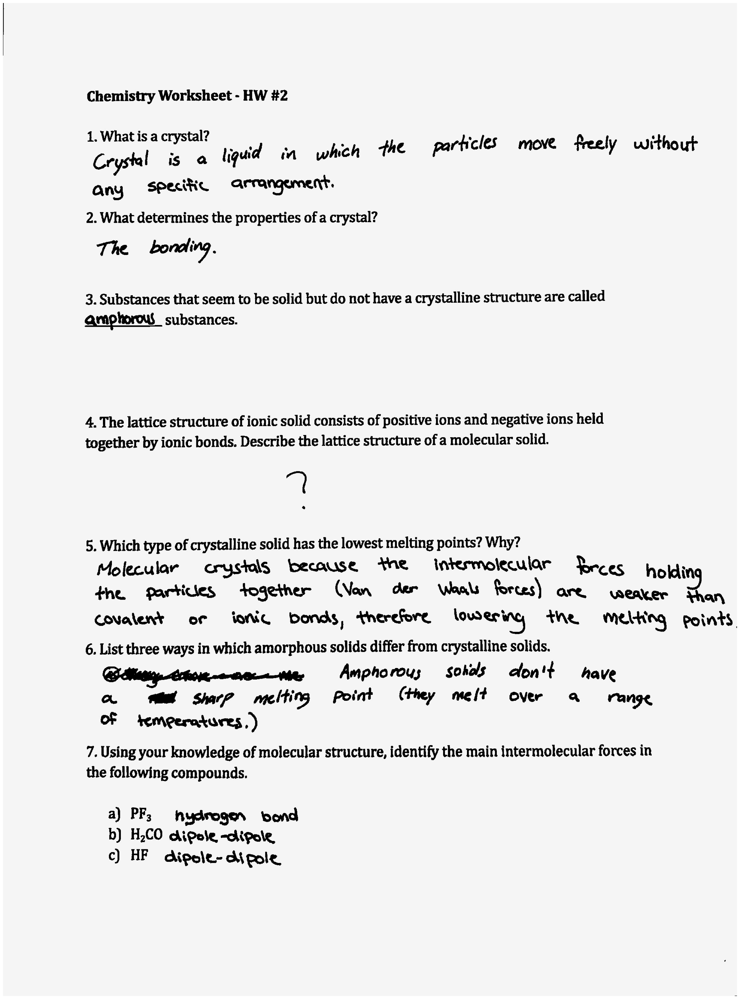

In [5]:
display(image)

KERAS OCR

In [6]:
pipeline = keras_ocr.pipeline.Pipeline()
results= pipeline.recognize([image])

Looking for /home/antrsk/.keras-ocr/craft_mlt_25k.h5


2024-03-29 23:31:46.594842: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:274] failed call to cuInit: CUDA_ERROR_UNKNOWN: unknown error
2024-03-29 23:31:46.594866: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:129] retrieving CUDA diagnostic information for host: Antriksh0704
2024-03-29 23:31:46.594871: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:136] hostname: Antriksh0704
2024-03-29 23:31:46.594970: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:159] libcuda reported version is: 550.67.0
2024-03-29 23:31:46.594986: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:163] kernel reported version is: 550.67.0
2024-03-29 23:31:46.594990: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:241] kernel version seems to match DSO: 550.67.0


Instructions for updating:
Use `tf.image.resize(...method=ResizeMethod.BILINEAR...)` instead.
Looking for /home/antrsk/.keras-ocr/crnn_kurapan.h5


2024-03-29 23:31:49.110813: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 792723456 exceeds 10% of free system memory.
2024-03-29 23:31:49.414391: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 792723456 exceeds 10% of free system memory.
2024-03-29 23:31:49.766736: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 792723456 exceeds 10% of free system memory.
2024-03-29 23:31:50.389343: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 792723456 exceeds 10% of free system memory.
2024-03-29 23:31:56.655637: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 594542592 exceeds 10% of free system memory.


6/6 [==============================] - 8s 1s/step


In [7]:
keras_bbox = bbox_keras(results, image)
cv2.imwrite("Datasets/kerasbbox.jpg", keras_bbox)

True

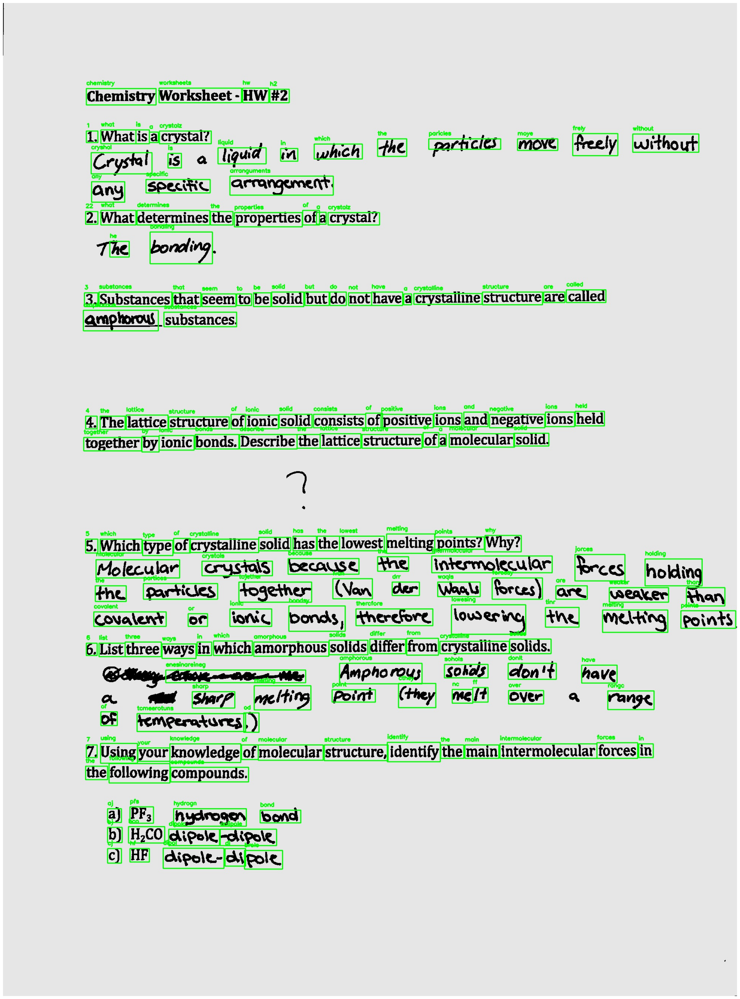

In [8]:
display("Datasets/kerasbbox.jpg")

PYTESSERACT

In [9]:
custom_config = r'--oem 1 --psm 3'

In [10]:
resultbox = pytesseract.image_to_boxes(image, config=custom_config)

In [11]:
resulttext= pytesseract.image_to_string(image, config=custom_config)

In [12]:
print(resulttext)

Chemistry Worksheet - HW #2

1. What is a crystal? : :
Crys © a lig wd in when The particles move freely without
any specific arrangement.

2. What determines the properties of a crystal?

The bonding.

3. Substances that seem to be solid but do not have a crystalline structure are called

amphorow _ substances.

4. The lattice structure of ionic solid consists of positive ions and negative ions held
together by ionic bonds. Describe the lattice structure of a molecular solid.

5. Which type of crystalline solid has the lowest melting points? Why?
Molecular crystals because the intermolecular Beces holdin
fhe parties together (Van der Waals forces) are weaver Than
covalent or WNC bonds, therefore lowsesing Tne. MUKey points
6. List three ways in which amorphous solids differ from crystalline solids.
Amphoroys  sobdls don't have
owe Sharp melting point (they melt over a range
Of iemeeratures,)

7. Using your knowledge of molecular structure, identify the main intermolecular forces in
th

In [13]:
tess_bbox = bbox_tess(resultbox, image)
cv2.imwrite("Datasets/tessbbox.jpg", tess_bbox)

True

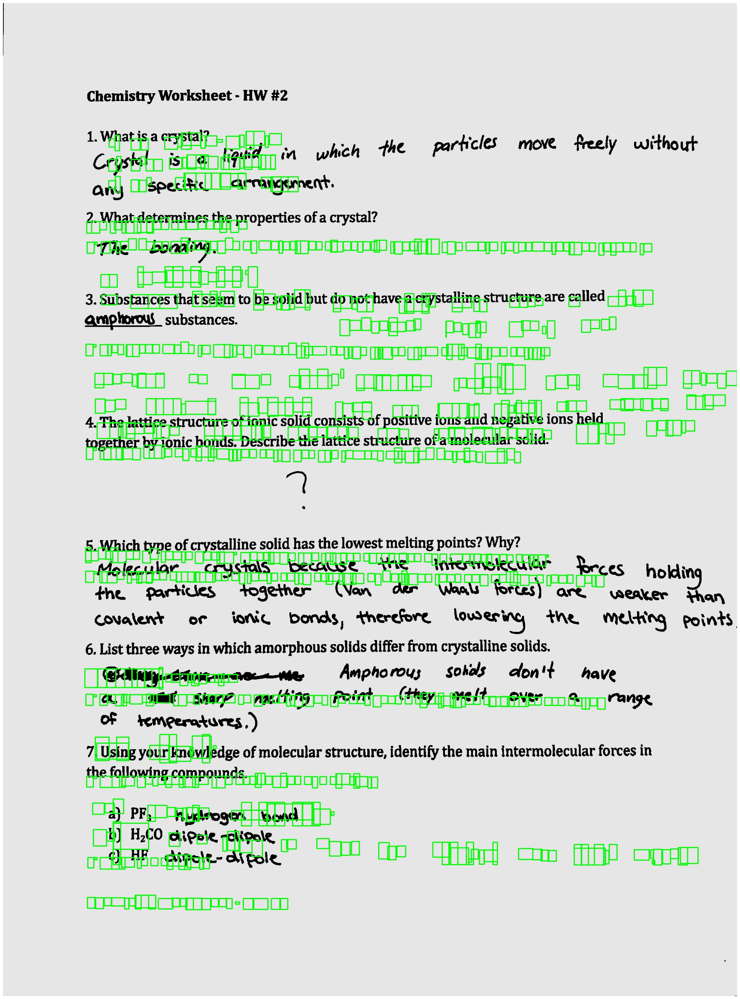

In [14]:
display("Datasets/tessbbox.jpg")

EASY OCR

In [15]:
reader = easyocr.Reader(['en'], gpu=True)
resulteasy = reader.readtext(image)

/home/antrsk/VScode/.venv/lib/python3.11/site-packages/torch/cuda/__init__.py:141: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:108.)
  return torch._C._cuda_getDeviceCount() > 0
Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


In [16]:
easy_bbox = bbox_easy(resulteasy, image)
cv2.imwrite("Datasets/easybbox.jpg", easy_bbox)

True

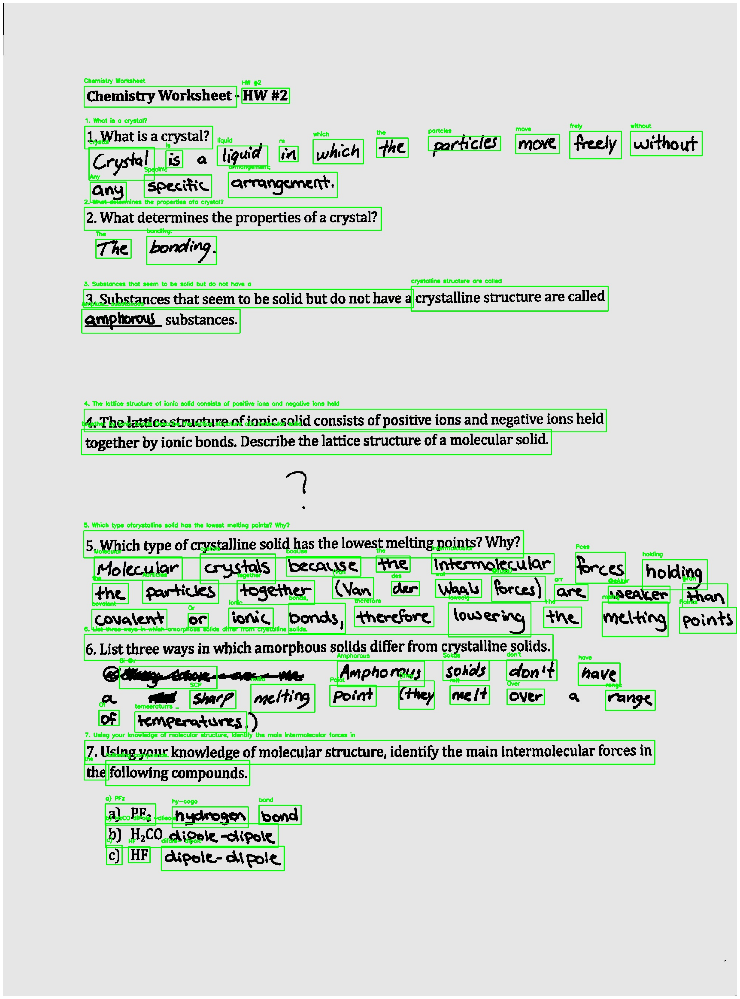

In [17]:
display("Datasets/easybbox.jpg")